In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
kmader_skin_cancer_mnist_ham10000_path = kagglehub.dataset_download('kmader/skin-cancer-mnist-ham10000')
tschandl_ham10000_lesion_segmentations_path = kagglehub.dataset_download('tschandl/ham10000-lesion-segmentations')

print('Data source import complete.')


In [ ]:
!pip install -q torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118
!pip install -q opencv-python tqdm matplotlib pandas seaborn
!pip install -q albumentations  # Data augmentation

import sys
sys.path.append('/kaggle/working')

In [ ]:
import os
from pathlib import Path

# Kaggle dataset paths
IMAGE_DIR1 = "/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1"
IMAGE_DIR2 = "/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_2"
IMAGE_DIRS = [IMAGE_DIR1, IMAGE_DIR2]
MASK_DIR = "/kaggle/input/ham10000-lesion-segmentations/HAM10000_segmentations_lesion_tschandl"
METADATA_PATH = "/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_metadata.csv"

# Create output directories
!mkdir -p /kaggle/working/outputs/{models,logs,predictions}
!mkdir -p /kaggle/working/processed/{images_512,annotations}

# **EDA**

Dataset loaded: 10015 samples

Missing values:
lesion_id: 0.0%
image_id: 0.0%
dx: 0.0%
dx_type: 0.0%
age: 0.57%
sex: 0.0%
localization: 0.0%
Found 10015 images

LOG: CLASS MAPPING REFERENCE
ID 1: akiec
ID 2: bcc
ID 3: bkl
ID 4: df
ID 5: mel
ID 6: nv
ID 7: vasc

Unique Labels in 'label' column: [3 6 4 5 7 2 1]

Label counts:
label
1     327
2     514
3    1099
4     115
5    1113
6    6705
7     142
Name: count, dtype: int64


/tmp/ipykernel_55/4178184833.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=id_counts.index, y=id_counts.values, ax=ax[0], palette='viridis')


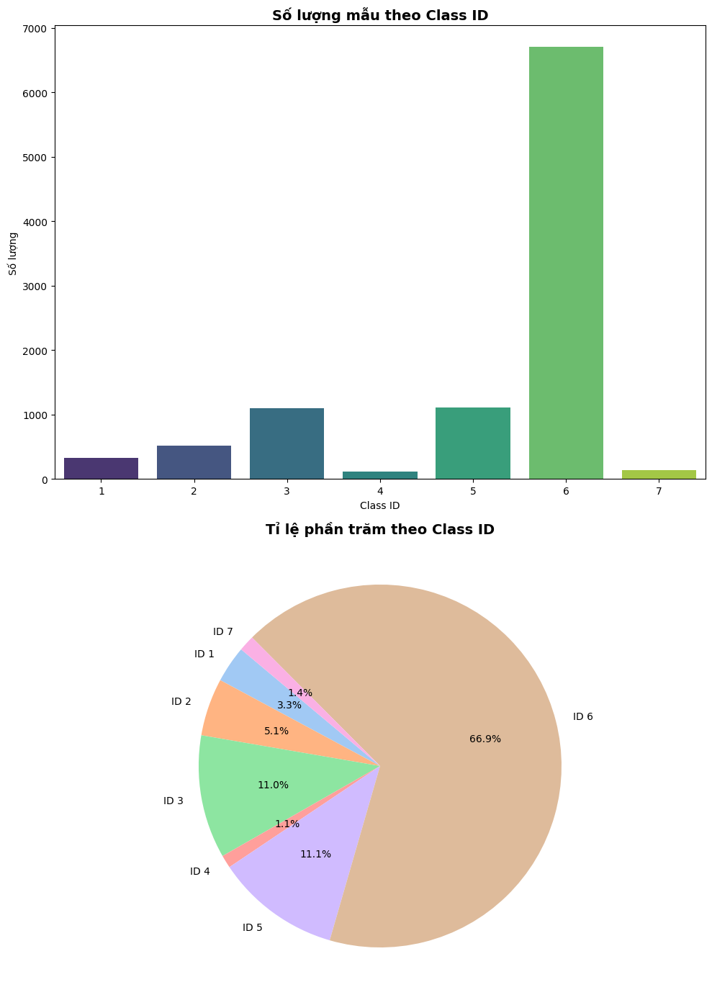

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from glob import glob

label_names = ['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']

# 1. Load Metadata và kiểm tra Missing values
metadata = pd.read_csv(METADATA_PATH)
num_examples = len(metadata)
print(f"Dataset loaded: {num_examples} samples")

print("\nMissing values:")
missing_percent = (metadata.isnull().sum() / len(metadata) * 100).round(2)
for col, percent in missing_percent.items():
    print(f"{col}: {percent}%")

# 2. Gộp đường dẫn ảnh (Dùng các biến DIR bạn đã khai báo)
image_path = {}
for folder_path in [IMAGE_DIR1, IMAGE_DIR2]:
    # Quét tất cả file .jpg trong từng folder
    part_images = {os.path.splitext(os.path.basename(x))[0]: x
                   for x in glob(os.path.join(str(folder_path), '*.jpg'))}
    image_path.update(part_images)
print(f"Found {len(image_path)} images")

# 3. Ánh xạ nhãn và gán đường dẫn vào DataFrame
# Lưu ý: label_names.index(x) + 1 để ID chạy từ 1-7
metadata['label'] = metadata['dx'].map(lambda x: label_names.index(x) + 1)
metadata['path'] = metadata['image_id'].map(image_path.get)
df = metadata

# 4. Hiển thị LOG ánh xạ (Class nào là số mấy)
print("\n" + "="*30)
print("LOG: CLASS MAPPING REFERENCE")
print("="*30)
mapping_info = df[['dx', 'label']].drop_duplicates().sort_values('label')
for _, row in mapping_info.iterrows():
    print(f"ID {row['label']}: {row['dx']}")
print("="*30)

# 5. Kiểm tra phân bổ qua ID
print("\nUnique Labels in 'label' column:", df['label'].unique())
print("\nLabel counts:")
print(df['label'].value_counts().sort_index())

# 6. Vẽ biểu đồ dựa trên ID (Cột trên, Tròn dưới)
id_counts = df['label'].value_counts().sort_index()
fig, ax = plt.subplots(2, 1, figsize=(10, 14))

# Biểu đồ cột theo ID
sns.barplot(x=id_counts.index, y=id_counts.values, ax=ax[0], palette='viridis')
ax[0].set_title('Số lượng mẫu theo Class ID', fontsize=14, fontweight='bold')
ax[0].set_xlabel('Class ID')
ax[0].set_ylabel('Số lượng')

# Biểu đồ tròn theo ID
ax[1].pie(id_counts, labels=[f"ID {i}" for i in id_counts.index],
        autopct='%1.1f%%', startangle=140, colors=sns.color_palette('pastel'))
ax[1].set_title('Tỉ lệ phần trăm theo Class ID', fontsize=14, fontweight='bold')

plt.tight_layout()
plt.show()

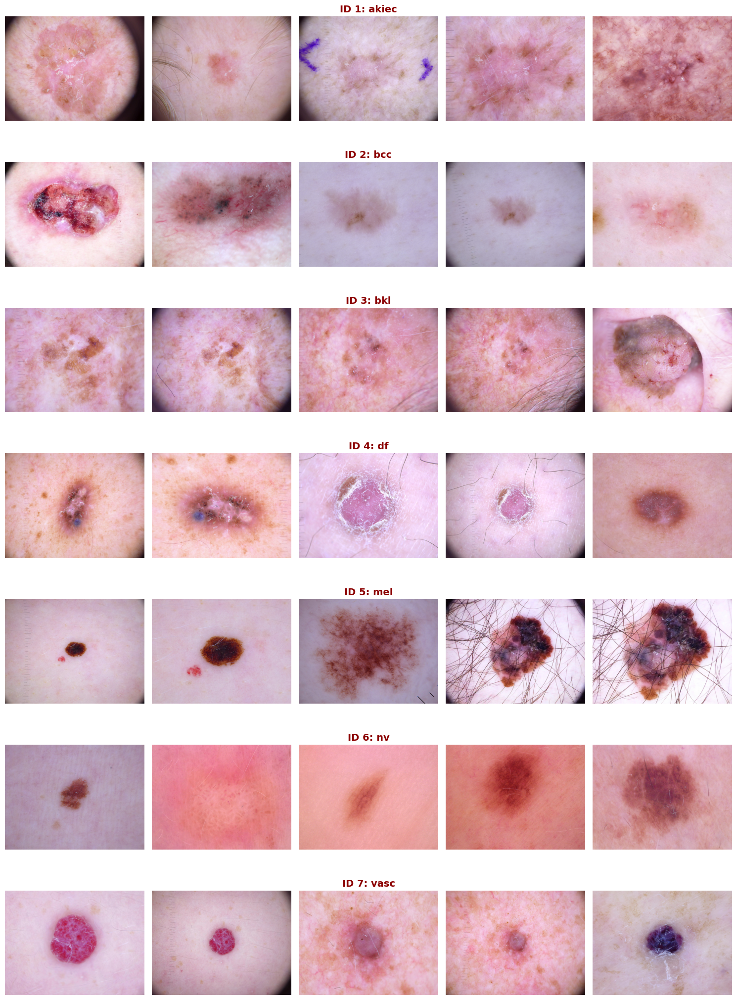

In [ ]:
import cv2

# Tạo một bảng tra cứu ID sang Tên bệnh để hiển thị trên biểu đồ
id_to_name = {i + 1: name for i, name in enumerate(label_names)}

# Lấy 5 mẫu cho mỗi nhãn (ID từ 1-7)
label_groups = {label: group.head(5)['path'].tolist()
                for label, group in df.groupby('label')}

num_labels = len(label_groups)
plt.figure(figsize=(15, 3 * num_labels))

for row, (label_id, images) in enumerate(sorted(label_groups.items())):
    for col, img_path in enumerate(images):
        img = cv2.imread(img_path)
        if img is None: continue # Phòng trường hợp đường dẫn lỗi
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        plt.subplot(num_labels, 5, row * 5 + col + 1)
        plt.imshow(img)
        plt.axis('off')

        # Hiển thị ID và Tên bệnh ở cột giữa (cột thứ 3)
        if col == 2:
            plt.title(f"ID {label_id}: {id_to_name[label_id]}", fontsize=14, fontweight='bold', color='darkred')

plt.tight_layout()
plt.show()

ĐANG KIỂM TRA HỆ THỐNG DỮ LIỆU...
   > Tổng số ảnh (.jpg): 10015
   > Tổng số mặt nạ (.png): 10015
Khớp dữ liệu: 100% ảnh và mặt nạ trùng khớp về tên file.

KIỂM TRA ĐỘ KHỚP HÌNH HỌC (Ảnh gốc + Mask):


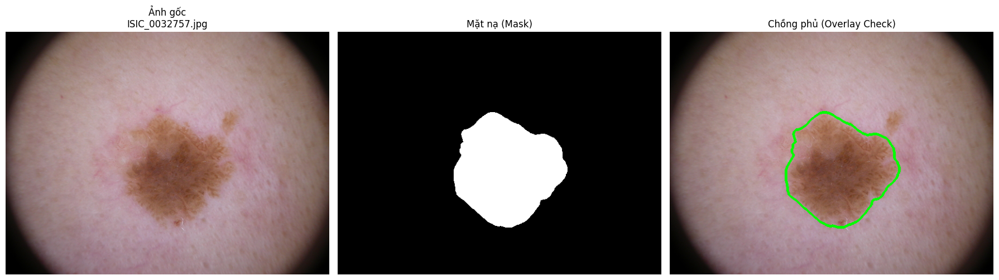

In [ ]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

def explore_data_logic(image_dirs, mask_dir):
    print("ĐANG KIỂM TRA HỆ THỐNG DỮ LIỆU...")

    # 1. Kiểm tra số lượng file thực tế trên ổ đĩa
    all_images = []
    for d in image_dirs:
        all_images.extend(list(Path(d).glob("*.jpg")))
    all_masks = list(Path(mask_dir).glob("*.png"))

    print(f"   > Tổng số ảnh (.jpg): {len(all_images)}")
    print(f"   > Tổng số mặt nạ (.png): {len(all_masks)}")

    # 2. Kiểm tra tính khớp giữa Ảnh và Mask bằng ID
    img_ids = {f.stem for f in all_images}
    mask_ids = {f.name.replace("_segmentation", "").replace(".png", "") for f in all_masks}

    if img_ids == mask_ids:
        print("Khớp dữ liệu: 100% ảnh và mặt nạ trùng khớp về tên file.")
    else:
        missing_masks = img_ids - mask_ids
        print(f"Cảnh báo: Có {len(missing_masks)} ảnh không tìm thấy mặt nạ tương ứng!")

    # 3. Trực quan hóa độ khớp hình học (Overlay)
    print("\nKIỂM TRA ĐỘ KHỚP HÌNH HỌC (Ảnh gốc + Mask):")
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    # Chọn một ảnh ngẫu nhiên để kiểm tra
    idx = np.random.randint(len(all_images))
    img_path = all_images[idx]
    # Tìm mask tương ứng dựa trên tên ảnh
    target_mask_name = f"{img_path.stem}_segmentation.png"
    mask_path = os.path.join(mask_dir, target_mask_name)

    if os.path.exists(mask_path):
        img = cv2.imread(str(img_path))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

        # Tạo Overlay: Vẽ viền xanh lá (contour) của mask lên ảnh gốc
        overlay = img.copy()
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cv2.drawContours(overlay, contours, -1, (0, 255, 0), 3)

        axes[0].imshow(img)
        axes[0].set_title(f"Ảnh gốc\n{img_path.name}")
        axes[1].imshow(mask, cmap='gray')
        axes[1].set_title("Mặt nạ (Mask)")
        axes[2].imshow(overlay)
        axes[2].set_title("Chồng phủ (Overlay Check)")

    for ax in axes: ax.axis('off')
    plt.tight_layout()
    plt.show()

# Thực thi kiểm tra (Sử dụng các biến đường dẫn bạn đã khai báo)
explore_data_logic([IMAGE_DIR1, IMAGE_DIR2], MASK_DIR)

#**PREPROCESSING**



In [ ]:
def create_bbox_from_mask(mask_path):
    mask = cv2.imread(str(mask_path), cv2.IMREAD_GRAYSCALE)
    if mask is None:
        return None

    h_max, w_max = mask.shape

    binary = (mask > 0).astype(np.uint8)

    # Loại nhiễu
    kernel = np.ones((3, 3), np.uint8)
    binary = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)

    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if len(contours) == 0:
        return None

    x, y, w, h = cv2.boundingRect(np.vstack(contours))

    # Add margin
    margin = 0.05
    dx = int(w * margin)
    dy = int(h * margin)

    x1 = max(0, x - dx)
    y1 = max(0, y - dy)
    x2 = min(w_max, x + w + dx)
    y2 = min(h_max, y + h + dy)

    if (x2 - x1) < 2 or (y2 - y1) < 2:
        return None

    return np.array([x1, y1, x2, y2], dtype=np.float32)

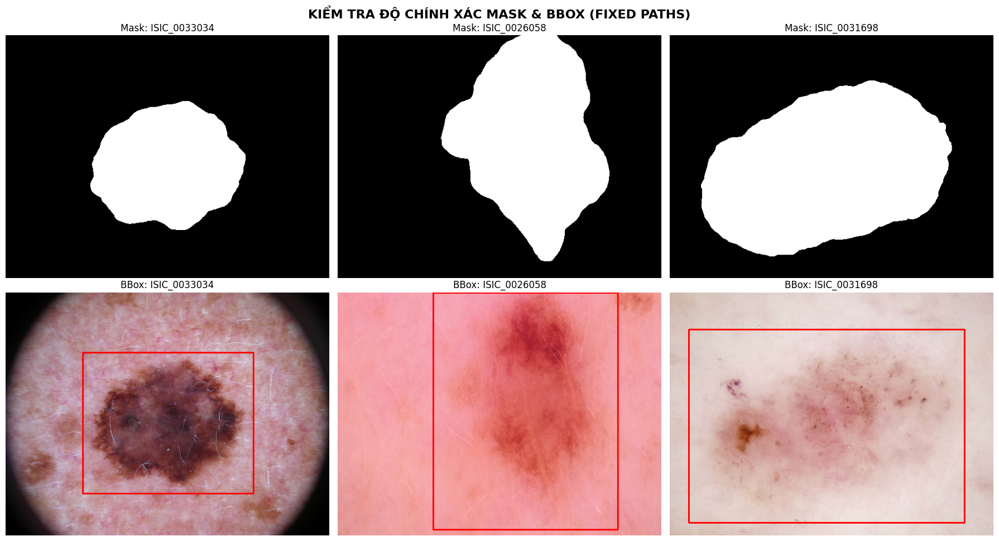

In [ ]:
def visualize_bbox_samples(image_dirs, mask_dir, num_samples=5):
    # 1. Lấy danh sách tất cả file png trong thư mục mask
    all_mask_files = [f for f in os.listdir(mask_dir) if f.endswith('.png')]
    mask_files = all_mask_files[:num_samples]

    if not mask_files:
        print("❌ Lỗi: Không tìm thấy file .png nào trong MASK_DIR!")
        return

    fig, axes = plt.subplots(2, num_samples, figsize=(18, 10))

    for i, mask_file in enumerate(mask_files):
        # 2. Tách Image ID (Linh hoạt với các loại hậu tố)
        # Nếu file là 'ISIC_0024306_segmentation.png' -> image_id là 'ISIC_0024306'
        image_id = mask_file.split('_attribute')[0].split('_segmentation')[0].replace('.png', '')

        # 3. Tìm đường dẫn ảnh gốc
        image_path = None
        for img_dir in image_dirs:
            potential_path = os.path.join(img_dir, f"{image_id}.jpg")
            if os.path.exists(potential_path):
                image_path = potential_path
                break

        if image_path is None:
            print(f"⚠️ Không tìm thấy ảnh gốc cho ID: {image_id}")
            continue

        # Đọc dữ liệu
        img = cv2.imread(image_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mask_path_full = os.path.join(mask_dir, mask_file)
        mask = cv2.imread(mask_path_full, cv2.IMREAD_GRAYSCALE)

        # Tính BBox và vẽ
        bbox = create_bbox_from_mask(mask_path_full)
        if bbox is not None:
            x1, y1, x2, y2 = bbox.astype(int)
            cv2.rectangle(img_rgb, (x1, y1), (x2, y2), (255, 0, 0), 2)

        axes[0, i].imshow(mask, cmap='gray')
        axes[0, i].set_title(f"Mask: {image_id}")
        axes[0, i].axis('off')

        axes[1, i].imshow(img_rgb)
        axes[1, i].set_title(f"BBox: {image_id}")
        axes[1, i].axis('off')

    plt.suptitle("KIỂM TRA ĐỘ CHÍNH XÁC MASK & BBOX (FIXED PATHS)", fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()
visualize_bbox_samples([IMAGE_DIR1, IMAGE_DIR2], MASK_DIR, num_samples=3)

**CHUYỂN THÀNH ĐỊNH DẠNG COCO LƯU THÀNH JSON VÀ CHIA TẬP DỮ LIỆU**

In [ ]:
from sklearn.utils import resample
from datetime import datetime
import pandas as pd
import numpy as np
import json
import cv2
from pathlib import Path
from tqdm import tqdm
from sklearn.model_selection import train_test_split

def create_coco_split_datasets():
    # 1. Categories: Đồng bộ ID từ 1-7
    label_names = ['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']
    categories = [{"id": i + 1, "name": name} for i, name in enumerate(label_names)]
    lesion_type_dict = {c["name"]: c["id"] for c in categories}

    # 2. Đọc metadata và chia tập Stratified
    metadata = pd.read_csv(METADATA_PATH)

    train_df_raw, temp_df = train_test_split(
        metadata, test_size=0.2, random_state=42, stratify=metadata["dx"]
    )
    val_df, test_df = train_test_split(
        temp_df, test_size=0.5, random_state=42, stratify=temp_df["dx"]
    )

    # --- KỸ THUẬT CÂN BẰNG: LẤY THEO GIÁ TRỊ TRUNG BÌNH (MEAN) ---
    # Thay vì lấy .max(), ta lấy trung bình cộng số lượng mẫu của các lớp
    avg_samples = int(train_df_raw['dx'].value_counts().mean())
    print(f"Chỉ số cân bằng (Mean): {avg_samples} mẫu mỗi lớp")

    balanced_train_list = []
    for cls in label_names:
        df_cls = train_df_raw[train_df_raw['dx'] == cls]

        # Thực hiện sampling:
        # - Lớp ít sẽ được nhân bản (replace=True)
        # - Lớp nhiều (như 'nv') sẽ bị lược bớt
        df_cls_balanced = df_cls.sample(n=avg_samples, replace=True, random_state=42)
        balanced_train_list.append(df_cls_balanced)

    train_df = pd.concat(balanced_train_list)
    # -----------------------------------------------------------

    split_dict = {"train": train_df, "val": val_df, "test": test_df}
    print(f"Dữ liệu sau split: Train({len(train_df)}) | Val({len(val_df)}) | Test({len(test_df)})")

    # 3. Tạo COCO JSON
    for split_name, df_to_process in split_dict.items():
        images = []
        annotations = []
        ann_id_counter = 0

        print(f"\nĐang tạo COCO JSON cho tập: {split_name.upper()}...")
        df_to_process = df_to_process.reset_index(drop=True)

        for idx, row in tqdm(df_to_process.iterrows(), total=len(df_to_process)):
            img_id = row['image_id']
            dx_class = row['dx']

            mask_path = Path(MASK_DIR) / f"{img_id}_segmentation.png"
            if not mask_path.exists():
                mask_path = Path(MASK_DIR) / f"{img_id}_attribute_lesion.png"
            if not mask_path.exists(): continue

            image_path = None
            for img_dir in [IMAGE_DIR1, IMAGE_DIR2]:
                p = Path(img_dir) / f"{img_id}.jpg"
                if p.exists():
                    image_path = p
                    break
            if image_path is None: continue

            # Đọc kích thước thực tế (Không hard-code)
            img_cv = cv2.imread(str(image_path))
            if img_cv is None: continue
            h_real, w_real = img_cv.shape[:2]

            bbox_raw = create_bbox_from_mask(str(mask_path))
            if bbox_raw is None: continue

            x1, y1, x2, y2 = bbox_raw
            w, h = x2 - x1, y2 - y1
            if w <= 2 or h <= 2: continue

            json_img_id = idx

            images.append({
                "id": json_img_id,
                "file_name": f"{img_id}.jpg",
                "width": int(w_real),
                "height": int(h_real)
            })

            annotations.append({
                "id": ann_id_counter,
                "image_id": json_img_id,
                "category_id": lesion_type_dict[dx_class],
                "bbox": [round(float(x1), 2), round(float(y1), 2), round(float(w), 2), round(float(h), 2)],
                "area": float(w * h),
                "iscrowd": 0
            })
            ann_id_counter += 1

        coco_format = {
            "info": {
                "description": f"HAM10000 {split_name} balanced dataset (Mean logic)",
                "year": 2026,
                "date_created": datetime.now().strftime("%Y-%m-%d")
            },
            "images": images,
            "annotations": annotations,
            "categories": categories
        }

        save_path = f"/kaggle/working/coco_{split_name}.json"
        with open(save_path, "w") as f:
            json.dump(coco_format, f)

        print(f"Đã lưu {save_path} | Số nhãn: {len(annotations)}")

# Thực thi
create_coco_split_datasets()

Chỉ số cân bằng (Mean): 1144 mẫu mỗi lớp
Dữ liệu sau split: Train(8008) | Val(1001) | Test(1002)

Đang tạo COCO JSON cho tập: TRAIN...


100%|██████████| 8008/8008 [01:58<00:00, 67.69it/s] 


Đã lưu /kaggle/working/coco_train.json | Số nhãn: 8008

Đang tạo COCO JSON cho tập: VAL...


100%|██████████| 1001/1001 [00:24<00:00, 41.57it/s]


Đã lưu /kaggle/working/coco_val.json | Số nhãn: 1001

Đang tạo COCO JSON cho tập: TEST...


100%|██████████| 1002/1002 [00:24<00:00, 40.24it/s]

Đã lưu /kaggle/working/coco_test.json | Số nhãn: 1002


In [ ]:
import json
from collections import defaultdict

def print_class_stats(json_path, split_name):
    with open(json_path, "r") as f:
        data = json.load(f)

    # Map category_id -> name
    cat_id_to_name = {cat["id"]: cat["name"] for cat in data["categories"]}

    # Đếm số annotation theo class
    ann_count = defaultdict(int)
    for ann in data["annotations"]:
        ann_count[ann["category_id"]] += 1

    print(f"\n===== {split_name.upper()} =====")
    print(f"{'ID':<5} {'Class':20s} {'#Annotations':>12}")
    print("-" * 40)

    for cat in data["categories"]:
        cid = cat["id"]
        name = cat["name"]
        count = ann_count[cid]
        print(f"{cid:<5} {name:20s} {count:>12}")

# --------- GỌI CHO 3 FILE ----------
print_class_stats("/kaggle/working/coco_train.json", "train")
print_class_stats("/kaggle/working/coco_val.json", "val")
print_class_stats("/kaggle/working/coco_test.json", "test")


===== TRAIN =====
ID    Class                #Annotations
----------------------------------------
1     akiec                        1144
2     bcc                          1144
3     bkl                          1144
4     df                           1144
5     mel                          1144
6     nv                           1144
7     vasc                         1144

===== VAL =====
ID    Class                #Annotations
----------------------------------------
1     akiec                          33
2     bcc                            51
3     bkl                           110
4     df                             12
5     mel                           111
6     nv                            670
7     vasc                           14

===== TEST =====
ID    Class                #Annotations
----------------------------------------
1     akiec                          32
2     bcc                            52
3     bkl                           110
4     df               

# **DATASET & DATALOADER**

In [ ]:
import os
import torch
from torch.utils.data import Dataset, DataLoader

class SkinLesionDataset(Dataset):
    def __init__(self, json_path, image_dirs, transform=None):
        with open(json_path, "r") as f:
            self.coco = json.load(f)
        self.image_dirs = image_dirs
        self.transform = transform
        self.images = self.coco["images"]
        self.ann_by_image = {}
        for ann in self.coco["annotations"]:
            self.ann_by_image.setdefault(ann["image_id"], []).append(ann)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_info = self.images[idx]
        file_name = img_info["file_name"]

        # Tìm ảnh trong các folder
        img_path = next((os.path.join(d, file_name) for d in self.image_dirs if os.path.exists(os.path.join(d, file_name))), None)
        image = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)

        anns = self.ann_by_image.get(img_info["id"], [])
        boxes, labels = [], []
        for ann in anns:
            x, y, w, h = ann["bbox"]
            boxes.append([x, y, x + w, y + h]) # Pascal VOC format
            labels.append(ann["category_id"])

        boxes = np.array(boxes, dtype=np.float32)
        labels = np.array(labels, dtype=np.int64)

        if self.transform:
            transformed = self.transform(image=image, bboxes=boxes, labels=labels)
            image, boxes, labels = transformed["image"], np.array(transformed["bboxes"]), np.array(transformed["labels"])

        target = {
            "boxes": torch.as_tensor(boxes, dtype=torch.float32),
            "labels": torch.as_tensor(labels, dtype=torch.int64),
            "image_id": torch.tensor(img_info["id"])
        }
        return image, target

def collate_fn(batch):
    return tuple(zip(*batch))

#Data Augmentation & Normalization

In [ ]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

# Bộ biến đổi cho tập TRAIN: Cần đa dạng để chống Overfitting
train_transform = A.Compose([
    # Xoay và lật để mô hình nhận diện tổn thương ở mọi hướng
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),

    # Co giãn và xoay nhẹ để mô phỏng khoảng cách chụp ảnh khác nhau
    A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.2, rotate_limit=30, p=0.5),

    # Thay đổi độ sáng/tương phản (rất quan trọng vì ảnh y tế thường khác nhau về ánh sáng)
    A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.3),

    # Chuẩn hóa (Normalize) theo thông số ImageNet
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))

# Bộ biến đổi cho tập VAL/TEST: Chỉ chuẩn hóa, không xoay lật để đánh giá khách quan
val_transform = A.Compose([
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    ToTensorV2()
], bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']))

/usr/local/lib/python3.12/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)
/usr/local/lib/python3.12/dist-packages/albumentations/core/composition.py:331: UserWarning: Got processor for bboxes, but no transform to process it.
  self._set_keys()


In [ ]:
# 2. Khởi tạo Dataset (Sử dụng 3 file JSON bạn đã tạo)
train_dataset = SkinLesionDataset("/kaggle/working/coco_train.json", IMAGE_DIRS, transform=train_transform)
val_dataset = SkinLesionDataset("/kaggle/working/coco_val.json", IMAGE_DIRS, transform=val_transform)
test_dataset = SkinLesionDataset("/kaggle/working/coco_test.json", IMAGE_DIRS, transform=val_transform)

#DATALOADER CONFIGURATION

In [ ]:
from torch.utils.data import DataLoader

# ================== PARAMS ==================
BATCH_SIZE = 8
NUM_WORKERS = 4

# ================== TRAIN LOADER ==================
train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    drop_last=False,
    persistent_workers=True,
    collate_fn=collate_fn
)

# ================== VAL LOADER ==================
val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    collate_fn=collate_fn
)

# ================== TEST LOADER ==================
test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True,
    collate_fn=collate_fn
)

print(f"Pipeline ready | BATCH_SIZE={BATCH_SIZE}")
print(
    f"Batches: "
    f"Train={len(train_loader)} | "
    f"Val={len(val_loader)} | "
    f"Test={len(test_loader)}"
)

Pipeline ready | BATCH_SIZE=8
Batches: Train=1001 | Val=126 | Test=126


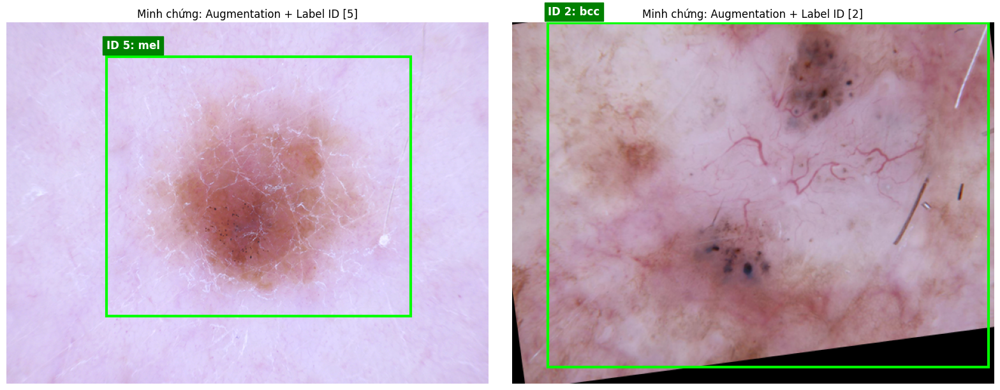

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

def visualize_final_check(dataloader, num_samples=4):
    # 1. Định nghĩa lại bảng tên để hiển thị cho chuẩn ID từ 1-7
    label_names = ['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']
    label_map = {i + 1: name for i, name in enumerate(label_names)}

    # Lấy một batch dữ liệu từ loader
    images, targets = next(iter(dataloader))

    rows = int(np.ceil(num_samples / 2))
    fig, axes = plt.subplots(rows, 2, figsize=(16, rows * 6))
    axes = axes.flatten()

    for i in range(num_samples):
        # Chuyển tensor về numpy và Denormalize
        img = images[i].permute(1, 2, 0).cpu().numpy()
        img = np.array([0.229, 0.224, 0.225]) * img + np.array([0.485, 0.456, 0.406])
        img = np.clip(img, 0, 1)

        ax = axes[i]
        ax.imshow(img)

        boxes = targets[i]['boxes'].cpu().numpy()
        labels = targets[i]['labels'].cpu().numpy()

        for box, label_id in zip(boxes, labels):
            x1, y1, x2, y2 = box
            name = label_map.get(label_id, f"Unknown({label_id})")

            # Vẽ Bbox
            rect = patches.Rectangle(
                (x1, y1), x2 - x1, y2 - y1,
                linewidth=3, edgecolor='#00FF00', facecolor='none'
            )
            ax.add_patch(rect)

            # Hiển thị ID và Tên lớp
            ax.text(x1, y1 - 10, f"ID {label_id}: {name}", color='white',
                    weight='bold', fontsize=12, backgroundcolor='green')

        ax.set_title(f"Minh chứng: Augmentation + Label ID {labels.tolist()}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()

# Chạy kiểm tra trên tập Train để thấy thành quả cân bằng và xoay/lật
visualize_final_check(train_loader, num_samples=2)

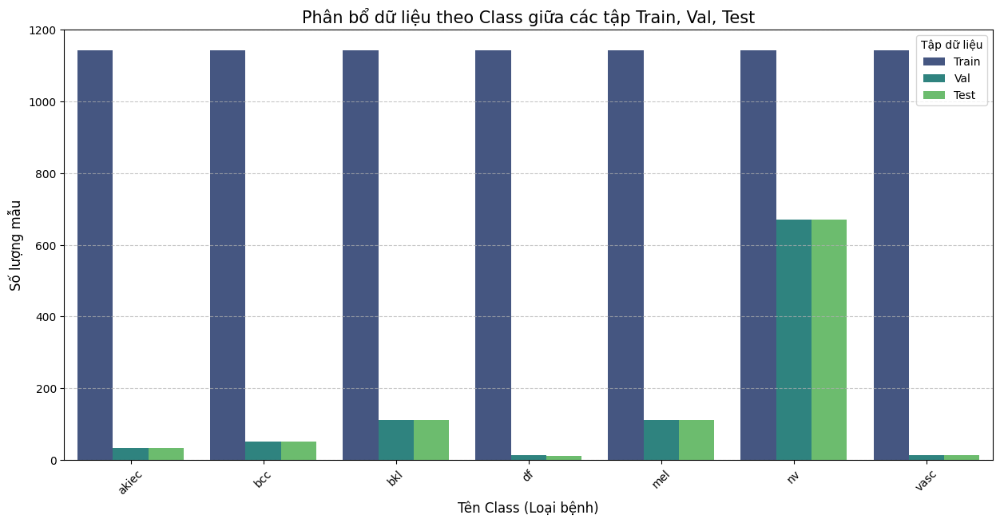

📊 Bảng thống kê kiểm tra đồng bộ ID và số lượng mẫu:


,Split,Test,Train,Val,Total
Class_ID,Class_Name,,,,
1,akiec,32,1144,33,1209
2,bcc,52,1144,51,1247
3,bkl,110,1144,110,1364
4,df,11,1144,12,1167
5,mel,112,1144,111,1367
6,nv,671,1144,670,2485
7,vasc,14,1144,14,1172


In [ ]:
import json
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def check_class_distribution_with_ids(json_paths):
    all_data = []

    for split_name, path in json_paths.items():
        with open(path, 'r') as f:
            data = json.load(f)

        # Tạo mapping từ category_id sang tên class
        cat_map = {cat['id']: cat['name'] for cat in data['categories']}

        # Thu thập dữ liệu từ annotations
        for ann in data['annotations']:
            all_data.append({
                'Split': split_name,
                'Class_ID': ann['category_id'], # Thêm ID vào đây
                'Class_Name': cat_map[ann['category_id']]
            })

    df_dist = pd.DataFrame(all_data)

    # 1. Vẽ biểu đồ phân bổ
    plt.figure(figsize=(15, 7))
    sns.countplot(data=df_dist, x='Class_Name', hue='Split', palette='viridis')
    plt.title('Phân bổ dữ liệu theo Class giữa các tập Train, Val, Test', fontsize=15)
    plt.xlabel('Tên Class (Loại bệnh)', fontsize=12)
    plt.ylabel('Số lượng mẫu', fontsize=12)
    plt.legend(title='Tập dữ liệu')
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

    # 2. In bảng thống kê chi tiết bao gồm cả ID để kiểm tra đồng bộ
    print("📊 Bảng thống kê kiểm tra đồng bộ ID và số lượng mẫu:")
    # Pivot table hiển thị cả ID và Name
    pivot_table = df_dist.pivot_table(
        index=['Class_ID', 'Class_Name'],
        columns='Split',
        aggfunc='size',
        fill_value=0
    )

    # Tính tổng hàng ngang
    pivot_table['Total'] = pivot_table.sum(axis=1)

    # Hiển thị bảng
    from IPython.display import display
    display(pivot_table)

# Chạy kiểm tra
json_files = {
    'Train': '/kaggle/working/coco_train.json',
    'Val': '/kaggle/working/coco_val.json',
    'Test': '/kaggle/working/coco_test.json'
}

check_class_distribution_with_ids(json_files)

#MODEL DEFINITION

In [ ]:
import torch
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

# =========================
# DEVICE
# =========================
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# HAM10000: 7 classes + background
NUM_CLASSES = 8

In [ ]:
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN_ResNet50_FPN_Weights

def get_faster_rcnn_model(num_classes):
    # ===== 1. Load pretrained Faster R-CNN với cấu hình Resize =====
    weights = FasterRCNN_ResNet50_FPN_Weights.DEFAULT

    # Thêm min_size và max_size vào đây.
    # Model sẽ tự động resize ảnh và Bbox về 512 trước khi đưa vào Backbone.
    model = fasterrcnn_resnet50_fpn(
        weights=weights,
        min_size=512,
        max_size=512
    )

    # ===== 2. Freeze entire backbone =====
    for param in model.backbone.parameters():
        param.requires_grad = False

    # ===== 3. Unfreeze layer4 + FPN (Để model học tốt hơn với dữ liệu mới) =====
    for name, param in model.backbone.named_parameters():
        if "layer4" in name or "fpn" in name:
            param.requires_grad = True

    # ===== 4. Replace classification head =====
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(
        in_features, num_classes
    )

    return model

In [ ]:
model = get_faster_rcnn_model(NUM_CLASSES)
model.to(DEVICE)

Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


100%|██████████| 160M/160M [00:00<00:00, 236MB/s] 


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(512,), max_size=512, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(i

#OPTIMIZER & TRAINING HYPERPARAMETERS SETUP

In [ ]:
EPOCHS = 30
LEARNING_RATE = 1e-4

optimizer = torch.optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=LEARNING_RATE,
    weight_decay=1e-4   # QUAN TRỌNG
)

In [ ]:
lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="max",          # maximize F1 / recall melanoma
    factor=0.7,          # giảm LR 50%
    patience=6,          # đợi lâu hơn cho detection metric ổn định
    min_lr=1e-6,         # chặn đáy LR
    threshold=1e-3,      # cải thiện nhỏ thì coi như không cải thiện
    threshold_mode="rel",
)

In [ ]:
print("Model sẵn sàng training")
print(f"Epochs        : {EPOCHS}")
print(f"Learning rate : {LEARNING_RATE}")
print(f"Trainable params: {sum(p.numel() for p in model.parameters() if p.requires_grad):,}")

Model sẵn sàng training
Epochs        : 30
Learning rate : 0.0001
Trainable params: 32,817,207


In [ ]:
from pycocotools.coco import COCO
coco_gt = COCO("/kaggle/working/coco_val.json")

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [ ]:
import torch
import numpy as np
from tqdm.auto import tqdm
from pycocotools.cocoeval import COCOeval
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from torchvision.ops import box_iou
import sys
import os
from contextlib import contextmanager

@contextmanager
def suppress_stdout():
    with open(os.devnull, "w") as f:
        old_stdout = sys.stdout
        sys.stdout = f
        try:
            yield
        finally:
            sys.stdout = old_stdout

def evaluate_fasterrcnn(
    model,
    dataloader,
    device,
    epoch,
    coco_gt,
    melanoma_class_id=5,
):
    model.eval()

    # ================= TORCHMETRICS (mAP) =================
    map_metric = MeanAveragePrecision(
        box_format="xyxy",
        iou_type="bbox"
    )

    all_outputs = []
    all_targets = []
    iou_list = []

    with torch.no_grad():
        for images, targets in tqdm(dataloader, desc=f"Val Epoch {epoch}", leave=False):
            images = [img.to(device) for img in images]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            outputs = model(images)

            map_metric.update(outputs, targets)

            all_outputs.extend(outputs)
            all_targets.extend(targets)

            # ---- IoU debug ----
            for out, tgt in zip(outputs, targets):
                if len(out["boxes"]) > 0 and len(tgt["boxes"]) > 0:
                    ious = box_iou(out["boxes"], tgt["boxes"])
                    iou_list.append(ious.max(dim=1)[0].mean().item())

    # ================= TORCHMETRICS RESULT =================
    tm = map_metric.compute()

    mean_iou = float(np.mean(iou_list)) if iou_list else 0.0

    # ================= PRECISION / RECALL (CHUẨN) =================
    precision_all, recall_all = compute_detection_precision_recall(
        all_outputs,
        all_targets,
        iou_threshold=0.5,
        score_threshold=0.3,
        class_id=None
    )

    precision_melanoma, recall_melanoma = compute_detection_precision_recall(
        all_outputs,
        all_targets,
        iou_threshold=0.5,
        score_threshold=0.3,
        class_id=melanoma_class_id
    )

    f1_all = 2 * precision_all * recall_all / (precision_all + recall_all + 1e-6)
    f1_melanoma = 2 * precision_melanoma * recall_melanoma / (
        precision_melanoma + recall_melanoma + 1e-6
    )

    # ================= RETURN =================
    return {
        "epoch": epoch,

        # ---- mAP ----
        "mAP_50_95": tm["map"].item(),
        "mAP_50": tm["map_50"].item(),
        "mAP_75": tm["map_75"].item(),

        # ---- MELANOMA (Y TẾ) ----
        "precision_melanoma": precision_melanoma,
        "recall_melanoma": recall_melanoma,
        "f1_melanoma": f1_melanoma,

        # ---- CHUNG ----
        "precision_all": precision_all,
        "recall_all": recall_all,
        "f1_all": f1_all,

        # ---- DEBUG ----
        "mean_IoU": mean_iou,
        "tm_raw": tm
    }

In [ ]:
history = {
    "epoch": [],

    # ================= LOSS =================
    "train_loss": [],
    "val_loss": [],

    # ================= mAP (COCO) =================
    "mAP_50_95": [],
    "mAP_50": [],
    "mAP_75": [],

    # ================= MELANOMA (Y TẾ – QUAN TRỌNG NHẤT) =================
    "precision_melanoma": [],         # precision detection melanoma (chuẩn)
    "recall_melanoma": [],            # recall detection melanoma (CỰC QUAN TRỌNG)
    "f1_melanoma": [],

    # ================= TOÀN BỘ MODEL =================
    "precision_all": [],
    "recall_all": [],
    "f1_all": [],

    # ================= DEBUG =================
    "mean_IoU": []
}

In [ ]:
def compute_detection_precision_recall(
    outputs,
    targets,
    iou_threshold=0.5,
    score_threshold=0.3,
    class_id=None  # None = ALL classes, số = class cụ thể (melanoma)
):
    TP, FP, FN = 0, 0, 0

    for out, tgt in zip(outputs, targets):
        pred_boxes  = out["boxes"]
        pred_labels = out["labels"]
        pred_scores = out["scores"]

        gt_boxes  = tgt["boxes"]
        gt_labels = tgt["labels"]

        # ---- score filter ----
        keep = pred_scores >= score_threshold
        pred_boxes  = pred_boxes[keep]
        pred_labels = pred_labels[keep]

        # ---- class filter ----
        if class_id is not None:
            pred_mask = pred_labels == class_id
            gt_mask   = gt_labels == class_id

            pred_boxes = pred_boxes[pred_mask]
            gt_boxes   = gt_boxes[gt_mask]

        matched_gt = set()

        if len(pred_boxes) > 0 and len(gt_boxes) > 0:
            ious = box_iou(pred_boxes, gt_boxes)

            for i in range(len(pred_boxes)):
                max_iou, gt_idx = ious[i].max(0)
                if max_iou >= iou_threshold and gt_idx.item() not in matched_gt:
                    TP += 1
                    matched_gt.add(gt_idx.item())
                else:
                    FP += 1
        else:
            FP += len(pred_boxes)

        FN += max(0, len(gt_boxes) - len(matched_gt))

    precision = TP / (TP + FP + 1e-6)
    recall    = TP / (TP + FN + 1e-6)

    return precision, recall

In [ ]:
def train_one_epoch(model, optimizer, dataloader, device, epoch):
    model.train()

    total_loss = 0.0
    num_batches = 0

    pbar = tqdm(dataloader, desc=f"Train Epoch {epoch}", leave=True)

    for images, targets in pbar:
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        total_loss += losses.item()
        num_batches += 1

        pbar.set_postfix(train_loss=f"{losses.item():.4f}")

    return total_loss / max(1, num_batches)

In [ ]:
def compute_val_loss(model, dataloader, device):
    model.train()

    total_loss = 0.0
    num_batches = 0

    with torch.no_grad():
        for images, targets in dataloader:
            images = [img.to(device) for img in images]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            loss_dict = model(images, targets)
            losses = sum(loss for loss in loss_dict.values())

            total_loss += losses.item()
            num_batches += 1

    return total_loss / max(1, num_batches)

In [ ]:
# ================= INITIAL SETUP =================
best_f1 = -1.0                 # theo dõi BEST F1 melanoma (chuẩn medical)
patience = 10                   # early stopping patience (CHỈ áp dụng stage 2)
trigger_times = 0

# ================= 2-STAGE SETUP =================
stage = 1                      # stage 1: recall safety | stage 2: clinical usability

RECALL_THRESHOLD = 0.8          # ngưỡng recall melanoma tối thiểu
MAP_MIN_THRESHOLD = 0.3         # tránh học box rác
RECALL_STREAK_REQUIRED = 3      # số epoch ổn định để chuyển stage

recall_streak = 0
recall_floor = None             # sàn recall (đặt khi sang stage 2)

print(f"Training starts | Stage {stage}")

# ================= TRAINING LOOP =================
for epoch in range(1, EPOCHS + 1):
    print(f"\nEpoch {epoch}/{EPOCHS} | Stage {stage}")

    # ==========================================================
    # TRAIN
    # ==========================================================
    train_loss = train_one_epoch(
        model, optimizer, train_loader, DEVICE, epoch
    )

    # ==========================================================
    # VALIDATION LOSS (monitor overfitting)
    # ==========================================================
    val_loss = compute_val_loss(
        model, val_loader, DEVICE
    )

    # ==========================================================
    # DETECTION METRICS (COCO + melanoma-specific)
    # ==========================================================
    val_metrics = evaluate_fasterrcnn(
        model,
        val_loader,
        DEVICE,
        epoch,
        coco_gt,
        melanoma_class_id=5
    )

    # ==========================================================
    # SAVE HISTORY
    # ==========================================================
    history["epoch"].append(epoch)
    history["train_loss"].append(train_loss)
    history["val_loss"].append(val_loss)

    history["mAP_50_95"].append(val_metrics["mAP_50_95"])
    history["mAP_50"].append(val_metrics["mAP_50"])
    history["mAP_75"].append(val_metrics["mAP_75"])

    history["precision_melanoma"].append(val_metrics["precision_melanoma"])
    history["recall_melanoma"].append(val_metrics["recall_melanoma"])
    history["f1_melanoma"].append(val_metrics["f1_melanoma"])

    history["precision_all"].append(val_metrics["precision_all"])
    history["recall_all"].append(val_metrics["recall_all"])
    history["f1_all"].append(val_metrics["f1_all"])

    history["mean_IoU"].append(val_metrics["mean_IoU"])

    # ==========================================================
    # LOG
    # ==========================================================
    print(
        f"Train Loss: {train_loss:.4f} | "
        f"Val Loss: {val_loss:.4f} | "
        f"mAP@50: {val_metrics['mAP_50']:.4f} | "
        f"Mel Recall: {val_metrics['recall_melanoma']:.4f} | "
        f"Mel F1: {val_metrics['f1_melanoma']:.4f}"
    )

    # ==========================================================
    # ================= STAGE LOGIC =================
    # ==========================================================
    if stage == 1:
        # ------------------------------------------------------
        # STAGE 1: SAFETY STAGE
        # Mục tiêu:
        #   - KHÔNG bỏ sót melanoma
        #   - Yêu cầu localization tối thiểu (mAP)
        # ------------------------------------------------------

        current_score = (
            0.7 * val_metrics["recall_melanoma"] +
            0.3 * val_metrics["mAP_50"]
        )

        # ---- CHỐNG SPIKE (recall cao 1 epoch nhưng không ổn định) ----
        if (
            val_metrics["recall_melanoma"] >= RECALL_THRESHOLD and
            val_metrics["mAP_50"] >= MAP_MIN_THRESHOLD
        ):
            recall_streak += 1
            print(f"Stable recall+localization streak: "
                  f"{recall_streak}/{RECALL_STREAK_REQUIRED}")
        else:
            recall_streak = 0
            print("Recall or mAP dropped → streak reset")

        # ---- CHUYỂN STAGE KHI ĐỦ ỔN ĐỊNH ----
        if recall_streak >= RECALL_STREAK_REQUIRED:
            stage = 2
            recall_floor = val_metrics["recall_melanoma"] * 0.97  # sàn recall mềm
            trigger_times = 0
            print(f"✅ Switching to STAGE 2 | Recall floor = {recall_floor:.4f}")

        # ❗ Stage 1:
        #   - KHÔNG early stopping
        #   - KHÔNG save best model
        pd.DataFrame(history).to_csv("metrics_history.csv", index=False)
        continue

    # ==========================================================
    # STAGE 2: CLINICAL USABILITY STAGE
    # Mục tiêu:
    #   - Tối ưu F1 melanoma
    #   - KHÔNG làm rớt recall quá mức an toàn
    # ==========================================================
    penalty = 0.0
    if val_metrics["recall_melanoma"] < recall_floor:
        penalty = 0.2 * (recall_floor - val_metrics["recall_melanoma"])
        print(f"⚠ Recall below floor → penalty applied: {penalty:.4f}")

    current_score = (
        0.7 * val_metrics["f1_melanoma"] +
        0.3 * val_metrics["mAP_50"] -
        penalty
    )

    print(f"Current Score: {current_score:.4f}")

    # ==========================================================
    # SAVE BEST MODEL (CHỈ THEO F1 MELANOMA)
    # ==========================================================
    monitor_value = val_metrics["f1_melanoma"]

    if monitor_value > best_f1:
        best_f1 = monitor_value
        trigger_times = 0

        torch.save(
            {
                "epoch": epoch,
                "stage": stage,
                "model_state_dict": model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "best_f1": best_f1,
                "metrics": val_metrics,
            },
            "best_model.pth",
        )

        print(f"✅ Best model saved | Best F1={best_f1:.4f}")

    else:
        trigger_times += 1
        if trigger_times >= patience:
            print("⏹ Early stopping triggered (F1 melanoma not improving)")
            break

    # ==========================================================
    # LR SCHEDULER (theo F1 melanoma)
    # ==========================================================
    lr_scheduler.step(monitor_value)

    current_lr = optimizer.param_groups[0]["lr"]
    print(f"Current LR: {current_lr:.6f}")

    # ==========================================================
    # SAVE METRICS
    # ==========================================================
    pd.DataFrame(history).to_csv("metrics_history.csv", index=False)

print(f"\nTraining finished | Best F1 melanoma: {best_f1:.4f}")

Training starts | Stage 1

Epoch 1/30 | Stage 1


Train Epoch 1:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 1:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.1790 | Val Loss: 0.1241 | mAP@50: 0.4493 | Mel Recall: 0.8108 | Mel F1: 0.3529
Stable recall+localization streak: 1/3

Epoch 2/30 | Stage 1


Train Epoch 2:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 2:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.1300 | Val Loss: 0.1149 | mAP@50: 0.4978 | Mel Recall: 0.9369 | Mel F1: 0.3171
Stable recall+localization streak: 2/3

Epoch 3/30 | Stage 1


Train Epoch 3:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 3:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.1133 | Val Loss: 0.0980 | mAP@50: 0.5647 | Mel Recall: 0.8198 | Mel F1: 0.3872
Stable recall+localization streak: 3/3
✅ Switching to STAGE 2 | Recall floor = 0.7952

Epoch 4/30 | Stage 2


Train Epoch 4:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 4:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.1060 | Val Loss: 0.1068 | mAP@50: 0.5728 | Mel Recall: 0.9279 | Mel F1: 0.3131
Current Score: 0.3910
✅ Best model saved | Best F1=0.3131
Current LR: 0.000100

Epoch 5/30 | Stage 2


Train Epoch 5:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 5:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.0990 | Val Loss: 0.0963 | mAP@50: 0.5802 | Mel Recall: 0.8378 | Mel F1: 0.3577
Current Score: 0.4244
✅ Best model saved | Best F1=0.3577
Current LR: 0.000100

Epoch 6/30 | Stage 2


Train Epoch 6:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 6:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.0947 | Val Loss: 0.0974 | mAP@50: 0.6201 | Mel Recall: 0.8919 | Mel F1: 0.3486
Current Score: 0.4300
Current LR: 0.000100

Epoch 7/30 | Stage 2


Train Epoch 7:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 7:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.0915 | Val Loss: 0.0904 | mAP@50: 0.6389 | Mel Recall: 0.8829 | Mel F1: 0.2899
Current Score: 0.3946
Current LR: 0.000100

Epoch 8/30 | Stage 2


Train Epoch 8:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 8:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.0897 | Val Loss: 0.0897 | mAP@50: 0.6411 | Mel Recall: 0.9099 | Mel F1: 0.3563
Current Score: 0.4417
Current LR: 0.000100

Epoch 9/30 | Stage 2


Train Epoch 9:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 9:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.0868 | Val Loss: 0.0839 | mAP@50: 0.6659 | Mel Recall: 0.9279 | Mel F1: 0.3909
Current Score: 0.4734
✅ Best model saved | Best F1=0.3909
Current LR: 0.000100

Epoch 10/30 | Stage 2


Train Epoch 10:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 10:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.0855 | Val Loss: 0.0843 | mAP@50: 0.6282 | Mel Recall: 0.9189 | Mel F1: 0.3566
Current Score: 0.4381
Current LR: 0.000100

Epoch 11/30 | Stage 2


Train Epoch 11:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 11:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.0820 | Val Loss: 0.0845 | mAP@50: 0.6475 | Mel Recall: 0.7568 | Mel F1: 0.4068
⚠ Recall below floor → penalty applied: 0.0077
Current Score: 0.4713
✅ Best model saved | Best F1=0.4068
Current LR: 0.000100

Epoch 12/30 | Stage 2


Train Epoch 12:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 12:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.0802 | Val Loss: 0.0805 | mAP@50: 0.6553 | Mel Recall: 0.9099 | Mel F1: 0.4174
Current Score: 0.4887
✅ Best model saved | Best F1=0.4174
Current LR: 0.000100

Epoch 13/30 | Stage 2


Train Epoch 13:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 13:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.0793 | Val Loss: 0.0872 | mAP@50: 0.6481 | Mel Recall: 0.9099 | Mel F1: 0.3855
Current Score: 0.4643
Current LR: 0.000100

Epoch 14/30 | Stage 2


Train Epoch 14:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 14:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.0807 | Val Loss: 0.0894 | mAP@50: 0.6897 | Mel Recall: 0.9459 | Mel F1: 0.3535
Current Score: 0.4544
Current LR: 0.000100

Epoch 15/30 | Stage 2


Train Epoch 15:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 15:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.0776 | Val Loss: 0.0826 | mAP@50: 0.6945 | Mel Recall: 0.8468 | Mel F1: 0.3829
Current Score: 0.4764
Current LR: 0.000100

Epoch 16/30 | Stage 2


Train Epoch 16:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 16:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.0755 | Val Loss: 0.0786 | mAP@50: 0.6810 | Mel Recall: 0.8919 | Mel F1: 0.4381
Current Score: 0.5109
✅ Best model saved | Best F1=0.4381
Current LR: 0.000100

Epoch 17/30 | Stage 2


Train Epoch 17:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 17:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.0729 | Val Loss: 0.0872 | mAP@50: 0.6367 | Mel Recall: 0.8288 | Mel F1: 0.4623
Current Score: 0.5146
✅ Best model saved | Best F1=0.4623
Current LR: 0.000100

Epoch 18/30 | Stage 2


Train Epoch 18:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 18:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.0705 | Val Loss: 0.0810 | mAP@50: 0.7003 | Mel Recall: 0.7748 | Mel F1: 0.3918
⚠ Recall below floor → penalty applied: 0.0041
Current Score: 0.4802
Current LR: 0.000100

Epoch 19/30 | Stage 2


Train Epoch 19:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 19:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.0691 | Val Loss: 0.0755 | mAP@50: 0.7071 | Mel Recall: 0.9279 | Mel F1: 0.4364
Current Score: 0.5176
Current LR: 0.000100

Epoch 20/30 | Stage 2


Train Epoch 20:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 20:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.0720 | Val Loss: 0.0761 | mAP@50: 0.6957 | Mel Recall: 0.8829 | Mel F1: 0.4224
Current Score: 0.5044
Current LR: 0.000100

Epoch 21/30 | Stage 2


Train Epoch 21:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 21:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.0705 | Val Loss: 0.0708 | mAP@50: 0.7124 | Mel Recall: 0.8378 | Mel F1: 0.4515
Current Score: 0.5297
Current LR: 0.000100

Epoch 22/30 | Stage 2


Train Epoch 22:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 22:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.0711 | Val Loss: 0.0791 | mAP@50: 0.7267 | Mel Recall: 0.7477 | Mel F1: 0.4911
⚠ Recall below floor → penalty applied: 0.0095
Current Score: 0.5523
✅ Best model saved | Best F1=0.4911
Current LR: 0.000100

Epoch 23/30 | Stage 2


Train Epoch 23:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 23:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.0709 | Val Loss: 0.0797 | mAP@50: 0.7038 | Mel Recall: 0.8649 | Mel F1: 0.4593
Current Score: 0.5327
Current LR: 0.000100

Epoch 24/30 | Stage 2


Train Epoch 24:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 24:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.0709 | Val Loss: 0.0844 | mAP@50: 0.7094 | Mel Recall: 0.9279 | Mel F1: 0.4079
Current Score: 0.4984
Current LR: 0.000100

Epoch 25/30 | Stage 2


Train Epoch 25:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 25:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.0689 | Val Loss: 0.0756 | mAP@50: 0.7072 | Mel Recall: 0.9189 | Mel F1: 0.3977
Current Score: 0.4905
Current LR: 0.000100

Epoch 26/30 | Stage 2


Train Epoch 26:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 26:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.0665 | Val Loss: 0.0719 | mAP@50: 0.7232 | Mel Recall: 0.9369 | Mel F1: 0.4119
Current Score: 0.5053
Current LR: 0.000100

Epoch 27/30 | Stage 2


Train Epoch 27:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 27:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.0691 | Val Loss: 0.0826 | mAP@50: 0.6881 | Mel Recall: 0.9009 | Mel F1: 0.4073
Current Score: 0.4916
Current LR: 0.000100

Epoch 28/30 | Stage 2


Train Epoch 28:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 28:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.0690 | Val Loss: 0.0799 | mAP@50: 0.7148 | Mel Recall: 0.7297 | Mel F1: 0.4880
⚠ Recall below floor → penalty applied: 0.0131
Current Score: 0.5429
Current LR: 0.000100

Epoch 29/30 | Stage 2


Train Epoch 29:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 29:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.0675 | Val Loss: 0.0886 | mAP@50: 0.7098 | Mel Recall: 0.9189 | Mel F1: 0.3709
Current Score: 0.4726
Current LR: 0.000070

Epoch 30/30 | Stage 2


Train Epoch 30:   0%|          | 0/1001 [00:00<?, ?it/s]

Val Epoch 30:   0%|          | 0/126 [00:00<?, ?it/s]

Train Loss: 0.0622 | Val Loss: 0.0733 | mAP@50: 0.7407 | Mel Recall: 0.9189 | Mel F1: 0.4268
Current Score: 0.5209
Current LR: 0.000070

Training finished | Best F1 melanoma: 0.4911


In [ ]:
def make_table(history, columns_map, title):
    """
    Hàm bổ trợ để tạo bảng text từ dictionary history
    """
    header = " | ".join(columns_map.values())
    separator = "-" * len(header)

    lines = [f"\n--- {title} ---", header, separator]

    # Lấy số lượng epoch từ list đầu tiên trong history
    num_epochs = len(next(iter(history.values())))

    for i in range(num_epochs):
        row = []
        for key in columns_map.keys():
            val = history[key][i]
            # Định dạng số thực 4 chữ số thập phân, còn lại để nguyên
            formatted_val = f"{val:.4f}" if isinstance(val, float) else str(val)
            row.append(formatted_val.ljust(len(columns_map[key])))
        lines.append(" | ".join(row))

    return "\n".join(lines) + "\n"
def export_history_clean(history, save_path="/kaggle/working/training_report.txt"):
    """
    Export báo cáo huấn luyện Faster R-CNN – HAM10000
    Chuẩn Object Detection & Y tế
    """

    # ===== BẢNG 1: LOSS + GLOBAL QUALITY =====
    table_global = make_table(
        history,
        {
            "epoch": "Epoch",
            "train_loss": "Tr_Loss",
            "val_loss": "Val_Loss",
            "mAP_50": "mAP@50",
            "mAP_75": "mAP@75",
            "mAP_50_95": "mAP@50:95",
            "mean_IoU": "IoU",
        },
        "GLOBAL TRAINING METRICS"
    )

    # ===== BẢNG 2: MELANOMA (Y TẾ – QUAN TRỌNG NHẤT) =====
    table_melanoma = make_table(
        history,
        {
            "epoch": "Epoch",
            "precision_melanoma": "Mel_Prec",
            "recall_melanoma": "Mel_Recall",
            "f1_melanoma": "Mel_F1",
        },
        "MELANOMA DETECTION PERFORMANCE"
    )

    # ===== BẢNG 3: TOÀN BỘ MODEL =====
    table_all = make_table(
        history,
        {
            "epoch": "Epoch",
            "precision_all": "All_Prec",
            "recall_all": "All_Recall",
            "f1_all": "All_F1",
        },
        "OVERALL MODEL PERFORMANCE"
    )

    # ===== GHÉP NỘI DUNG =====
    content = (
        "\n================ TRAINING REPORT ================\n"
        + table_global
        + table_melanoma
        + table_all
    )

    # ===== IN & LƯU =====
    print(content)
    with open(save_path, "w", encoding="utf-8") as f:
        f.write(content)

    print(f"✅ Báo cáo đã lưu tại: {save_path}")
export_history_clean(history)


================ TRAINING REPORT ================

--- GLOBAL TRAINING METRICS ---
Epoch | Tr_Loss | Val_Loss | mAP@50 | mAP@75 | mAP@50:95 | IoU
--------------------------------------------------------------
1     | 0.1790  | 0.1241   | 0.4493 | 0.3304 | 0.2881    | 0.7129
2     | 0.1300  | 0.1149   | 0.4978 | 0.3057 | 0.2995    | 0.7523
3     | 0.1133  | 0.0980   | 0.5647 | 0.4026 | 0.3595    | 0.7663
4     | 0.1060  | 0.1068   | 0.5728 | 0.4511 | 0.3771    | 0.7905
5     | 0.0990  | 0.0963   | 0.5802 | 0.4561 | 0.3937    | 0.7945
6     | 0.0947  | 0.0974   | 0.6201 | 0.4753 | 0.3969    | 0.7912
7     | 0.0915  | 0.0904   | 0.6389 | 0.5472 | 0.4485    | 0.8079
8     | 0.0897  | 0.0897   | 0.6411 | 0.5238 | 0.4382    | 0.8066
9     | 0.0868  | 0.0839   | 0.6659 | 0.5383 | 0.4509    | 0.8040
10    | 0.0855  | 0.0843   | 0.6282 | 0.4699 | 0.4189    | 0.7824
11    | 0.0820  | 0.0845   | 0.6475 | 0.4941 | 0.4476    | 0.8264
12    | 0.0802  | 0.0805   | 0.6553 | 0.5390 | 0.4500    | 0.819

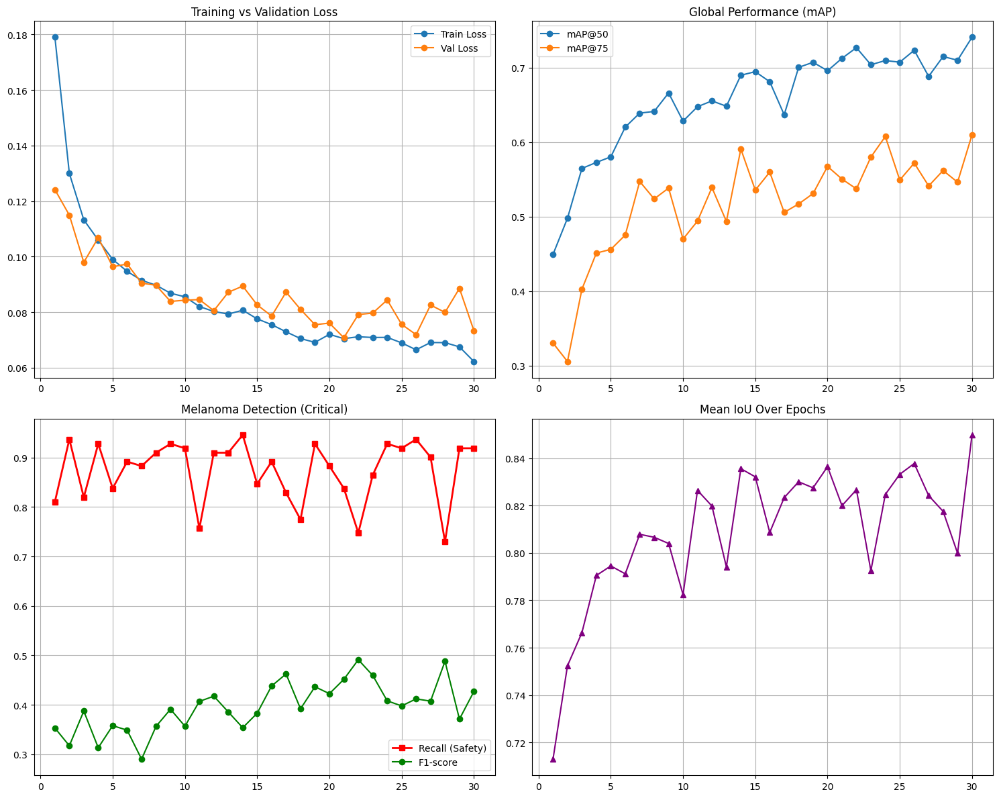

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# 1. Khởi tạo DataFrame từ history
df = pd.DataFrame(history)

# 2. Định nghĩa hàm làm mượt (Smoothing)
def smooth_curve(points, factor=0.75):
    smoothed_points = []
    for point in points:
        if smoothed_points:
            previous = smoothed_points[-1]
            smoothed_points.append(previous * factor + point * (1 - factor))
        else:
            smoothed_points.append(point)
    return smoothed_points

# Cấu hình độ mượt (0.0: không mượt, 0.9: cực mượt)
SMOOTH_FACTOR = 0.8

# 3. Thiết kế layout 2x2
fig, axs = plt.subplots(2, 2, figsize=(18, 14))
epochs = df["epoch"]

# --- BIỂU ĐỒ 1: TRAIN vs VAL LOSS ---
axs[0, 0].plot(epochs, df["train_loss"], alpha=0.3, color="dodgerblue", linestyle="--")
axs[0, 0].plot(epochs, df["val_loss"], alpha=0.3, color="darkorange", linestyle="--")
axs[0, 0].plot(epochs, smooth_curve(df["train_loss"], SMOOTH_FACTOR), color="dodgerblue", lw=2, label="Train Loss (Smooth)")
axs[0, 0].plot(epochs, smooth_curve(df["val_loss"], SMOOTH_FACTOR), color="darkorange", lw=2, label="Val Loss (Smooth)")
axs[0, 0].set_title("Training vs Validation Loss", fontsize=14)
axs[0, 0].legend()
axs[0, 0].grid(True, alpha=0.3)

# --- BIỂU ĐỒ 2: GLOBAL PERFORMANCE (mAP) ---
axs[0, 1].plot(epochs, df["mAP_50"], alpha=0.3, color="green")
axs[0, 1].plot(epochs, smooth_curve(df["mAP_50"], SMOOTH_FACTOR), color="green", lw=2, label="mAP@50 (Smooth)")
axs[0, 1].plot(epochs, smooth_curve(df["mAP_75"], SMOOTH_FACTOR), color="blue", lw=2, label="mAP@75 (Smooth)")
axs[0, 1].set_title("Global Performance (mAP)", fontsize=14)
axs[0, 1].legend()
axs[0, 1].grid(True, alpha=0.3)

# --- BIỂU ĐỒ 3: MELANOMA PERFORMANCE (Y TẾ - QUAN TRỌNG) ---
# Vẽ đường gốc mờ phía sau
axs[1, 0].plot(epochs, df["recall_melanoma"], alpha=0.2, color="red")
axs[1, 0].plot(epochs, df["f1_melanoma"], alpha=0.2, color="darkgreen")
# Vẽ đường mượt đậm phía trước
axs[1, 0].plot(epochs, smooth_curve(df["recall_melanoma"], SMOOTH_FACTOR), color="red", lw=3, label="Recall (Safety)")
axs[1, 0].plot(epochs, smooth_curve(df["f1_melanoma"], SMOOTH_FACTOR), color="darkgreen", lw=3, label="F1-score")
axs[1, 0].set_title("Melanoma Detection (Critical Metrics)", fontsize=14, fontweight='bold')
axs[1, 0].set_ylim(0, 1.05) # Giới hạn trục y để nhìn rõ recall cao
axs[1, 0].legend()
axs[1, 0].grid(True, alpha=0.3)

# --- BIỂU ĐỒ 4: LOCALIZATION QUALITY (IoU) ---
axs[1, 1].plot(epochs, df["mean_IoU"], alpha=0.3, color="purple")
axs[1, 1].plot(epochs, smooth_curve(df["mean_IoU"], SMOOTH_FACTOR), color="purple", lw=2, label="Mean IoU (Smooth)")
axs[1, 1].set_title("Mean IoU Over Epochs", fontsize=14)
axs[1, 1].legend()
axs[1, 1].grid(True, alpha=0.3)

plt.suptitle(f"Model Training Report (Smoothing Factor: {SMOOTH_FACTOR})", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [ ]:
import torch

# Đường dẫn file
checkpoint_path = "/kaggle/working/best_model.pth"

# Load checkpoint
# map_location=DEVICE giúp tránh lỗi nếu bạn chuyển đổi giữa CPU/GPU
checkpoint = torch.load(checkpoint_path, map_location=DEVICE)

# Load trọng số vào model
model.load_state_dict(checkpoint["model_state_dict"])
model.to(DEVICE)
model.eval()

# In thông tin báo cáo - SỬA LỖI TẠI ĐÂY
print(
    f"✅ Loaded BEST model | "
    f"Epoch: {checkpoint['epoch']} | "
    f"Stage: {checkpoint['stage']} | "
    f"Best F1: {checkpoint['best_f1']:.4f}"  # Đã đổi từ best_score thành best_f1
)

# Nếu bạn muốn xem thêm các chỉ số chi tiết khác đã lưu:
print(f"Details - Recall Melanoma: {checkpoint['metrics']['recall_melanoma']:.4f}")

✅ Loaded BEST model | Epoch: 22 | Stage: 2 | Best F1: 0.4911
Details - Recall Melanoma: 0.7477


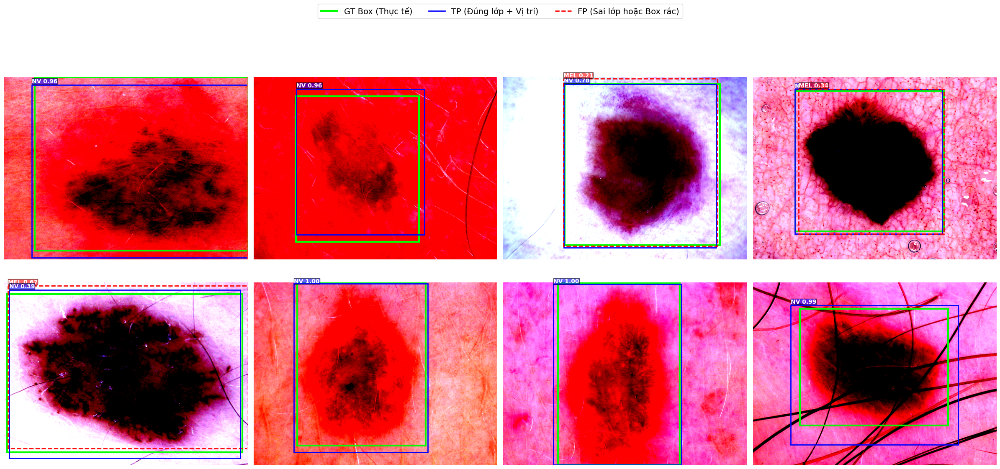

In [ ]:
def visualize_test_predictions(
    model=model,
    dataset=test_dataset,
    num_samples=8,
    score_threshold=0.2, # ĐÃ HẠ THẤP: Để bắt các lớp hiếm như Melanoma
    iou_threshold=0.3    # ĐÃ GIẢM: Để dễ dàng chấp nhận box khớp hơn
):
    model.eval()
    # Danh sách class chuẩn của HAM10000
    class_names = ['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']

    rows, cols = 2, 4
    fig, axes = plt.subplots(rows, cols, figsize=(24, 12))
    axes = axes.flatten()

    # ===== LEGEND =====
    legend_elements = [
        Line2D([0], [0], color="lime", lw=3, label="GT Box (Thực tế)"),
        Line2D([0], [0], color="blue", lw=2, label="TP (Đúng lớp + Vị trí)"),
        Line2D([0], [0], color="red", lw=2, linestyle="--", label="FP (Sai lớp hoặc Box rác)"),
    ]
    fig.legend(handles=legend_elements, loc="upper center", ncol=3, fontsize=14)

    # Chọn mẫu ngẫu nhiên
    indices = np.random.choice(len(dataset), num_samples, replace=False)

    for i, idx in enumerate(indices):
        image, target = dataset[idx]

        with torch.no_grad():
            output = model([image.to(DEVICE)])[0]

        img = image.permute(1, 2, 0).cpu().numpy()
        # Clip dữ liệu ảnh để tránh lỗi hiển thị nếu ảnh chưa chuẩn hóa 0-1
        img = np.clip(img, 0, 1)
        axes[i].imshow(img)

        gt_boxes = target["boxes"].cpu()
        gt_labels = target["labels"].cpu()

        pred_boxes = output["boxes"].cpu()
        pred_labels = output["labels"].cpu()
        pred_scores = output["scores"].cpu()

        # Lọc theo threshold ngay lập tức
        keep = pred_scores > score_threshold
        pred_boxes = pred_boxes[keep]
        pred_labels = pred_labels[keep]
        pred_scores = pred_scores[keep]

        matched_gt = set()

        # ================= VẼ GROUND TRUTH (MÀU XANH LÁ) =================
        for gt_box in gt_boxes:
            box = gt_box.numpy()
            axes[i].add_patch(plt.Rectangle((box[0], box[1]), box[2]-box[0], box[3]-box[1],
                                            fill=False, color="lime", linewidth=3))

        # ================= VẼ PREDICTIONS =================
        for box, label, score in zip(pred_boxes, pred_labels, pred_scores):
            box_np = box.numpy()
            label_id = label.item()

            # Tính IoU với tất cả GT để xác định TP/FP
            if len(gt_boxes) > 0:
                ious = box_iou(box.unsqueeze(0), gt_boxes)
                max_iou, gt_idx = ious.max(dim=1)
                max_iou = max_iou.item()
                gt_idx = gt_idx.item()
                # Kiểm tra xem có đúng class không (vì label trong Faster R-CNN thường bắt đầu từ 1)
                correct_class = (label_id == gt_labels[gt_idx].item())
            else:
                max_iou, gt_idx, correct_class = 0, -1, False

            if max_iou >= iou_threshold and gt_idx not in matched_gt and correct_class:
                status, color = "TP", "blue"
                matched_gt.add(gt_idx)
            else:
                status, color = "FP", "red"

            axes[i].add_patch(plt.Rectangle((box_np[0], box_np[1]), box_np[2]-box_np[0], box_np[3]-box_np[1],
                                            fill=False, color=color, linewidth=2,
                                            linestyle="--" if status == "FP" else "-"))

            # Text hiển thị: Class + Score
            display_name = class_names[label_id-1].upper()
            axes[i].text(box_np[0], max(box_np[1] - 5, 0),
                         f"{display_name} {score:.2f}",
                         color="white", fontsize=10, fontweight='bold',
                         bbox=dict(facecolor=color, alpha=0.6, pad=0))

        # ================= CẢNH BÁO BỎ SÓT (MISSING) =================
        for j, (gt_box, gt_label) in enumerate(zip(gt_boxes, gt_labels)):
            if j not in matched_gt:
                g_box = gt_box.numpy()
                axes[i].text(g_box[0], g_box[3] + 15, f"MISS: {class_names[gt_label.item()-1].upper()}",
                             color="yellow", backgroundcolor="red", fontsize=10, fontweight="bold")

        axes[i].axis("off")

    plt.tight_layout(rect=[0, 0, 1, 0.92])
    plt.show()

# CHẠY THỬ VỚI THRESHOLD THẤP
visualize_test_predictions(score_threshold=0.2)

In [ ]:
import torch
from IPython.display import FileLink

# ================== PATH ==================
MODEL_PATH = "/kaggle/working/best_modell.pth"

# ================== CHECKPOINT ==================
checkpoint = {
    # ===== TRAINING STATE =====
    "last_epoch": history["epoch"][-1] if len(history["epoch"]) > 0 else 0,
    "best_f1": best_f1,                   # ĐỔI TỪ best_score THÀNH best_f1
    "current_stage": stage,
    "patience": patience,

    # ===== MODEL STATE =====
    "model_state_dict": model.state_dict(),
    "optimizer_state_dict": optimizer.state_dict(),
    "lr_scheduler_state_dict": lr_scheduler.state_dict(),

    # ===== TRAINING HISTORY =====
    "history": history,

    # ===== METADATA =====
    "config": {
        "model_name": "Faster R-CNN ResNet50 FPN V2",
        "dataset": "HAM10000 - Skin Cancer Detection",
        "num_classes": NUM_CLASSES,
        "batch_size": BATCH_SIZE,
        "learning_rate": optimizer.param_groups[0]["lr"],
        "primary_metric": "recall_melanoma → f1_melanoma",
        "selection_score": "0.7 * melanoma_metric + 0.3 * mAP@50",
        "iou_threshold": 0.5,
        "score_threshold": 0.3,
        "melanoma_class_id": 5,
    },
}

# ================== SAVE ==================
torch.save(checkpoint, MODEL_PATH)

print("✅ FULL CHECKPOINT SAVED (Medical-grade / Resume-ready)")
print(f"📍 Path: {MODEL_PATH}")
print(f"🏆 Best medical F1: {best_f1:.4f}") # ĐỔI TÊN Ở ĐÂY LUÔN
print(f"🧠 Final training stage: {stage}")
print("-" * 50)

# Link tải file
display(FileLink(MODEL_PATH))

✅ FULL CHECKPOINT SAVED (Medical-grade / Resume-ready)
📍 Path: /kaggle/working/best_modell.pth
🏆 Best medical F1: 0.4911
🧠 Final training stage: 2
--------------------------------------------------


/kaggle/working/best_modell.pth